## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
from collections import deque
import os
%matplotlib inline

In [7]:
def plot_double(img1, img2, title1='', title2='', figsize=(24, 9)):
    """Plot two images side by side.
    """
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(title1, fontsize=25)
    ax2.imshow(img2)
    ax2.set_title(title2, fontsize=25)
    # f.show()

### How I do camera calibration 

I define function calibration_parametersl() to get the camara calibration parameters mtx and dist. Then use these tweo parameters to
to calibrate camera by using function undistort_image().

Then I test the calibration image one by one and draw the corners that finds in the image.

Wrong
Wrong
Wrong


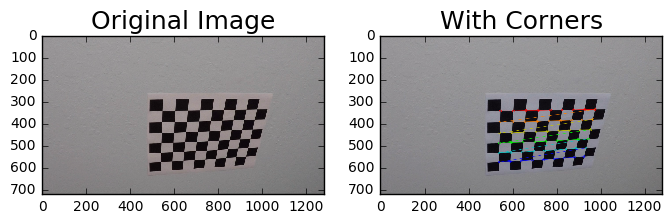

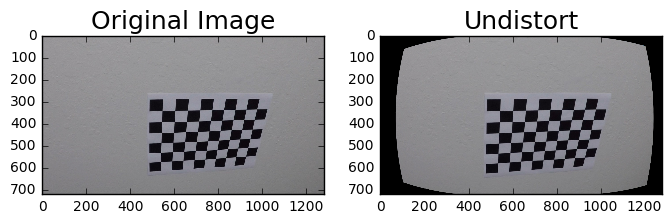

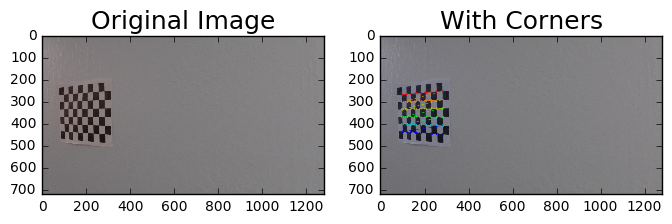

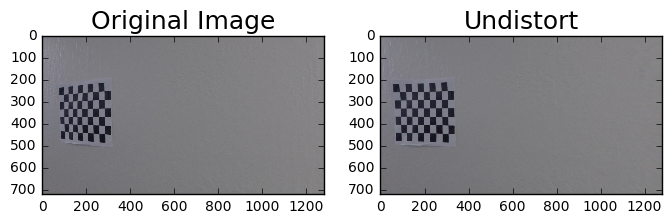

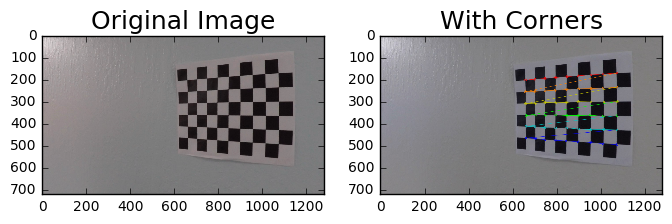

...

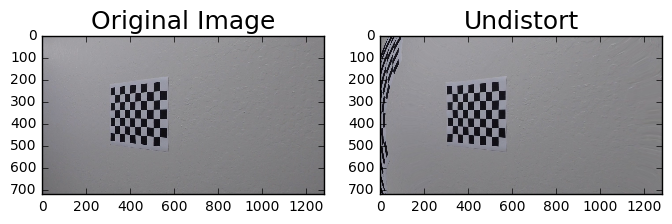

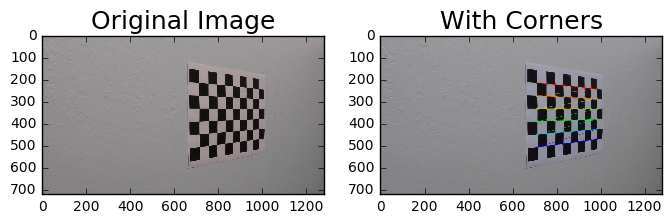

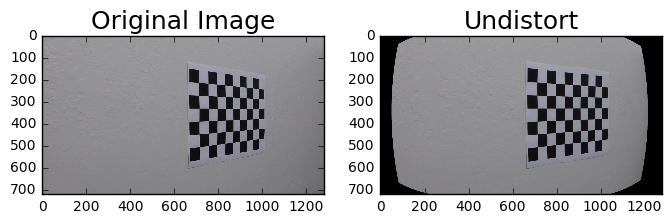

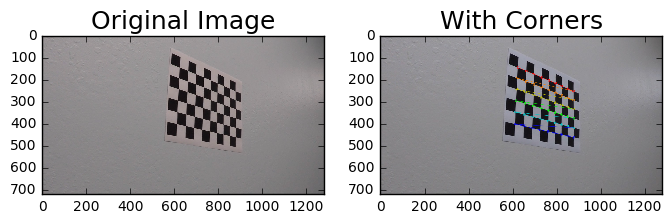

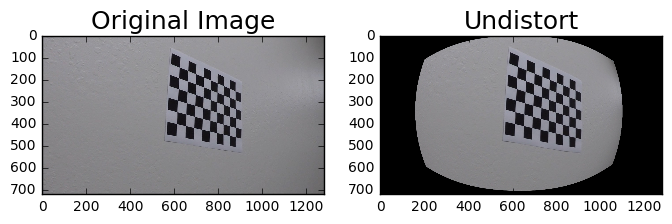

In [3]:
def calibration_parameters1(image,show=True):
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
   # images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
    img = cv2.imread(image)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        if show==True:
            f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
            ax1.imshow(cv2.cvtColor(mpimg.imread(image), cv2.COLOR_BGR2RGB))
            ax1.set_title('Original Image', fontsize=18)
            ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax2.set_title('With Corners', fontsize=18)
        
        objpoints.append(objp)
        imgpoints.append(corners)
    

        
    #img = cv2.imread(image)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_size = gray.shape[::-1]
# Do camera calibration given object points and image points
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
        return mtx,dist
    else:
        return False
    
    '''
    for fname in images:
        img=cv2.imread(fname)
        undist = cv2.undistort(img, mtx, dist, None, mtx) 
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistort', fontsize=18)
    #return undist,mtx,dist
        '''
    
def undistort_image(img, mtx, dist):
    """Undistort an image.
    """
    undistort=cv2.undistort(img, mtx, dist, None, mtx)
    return undistort

#cv2.destroyAllWindows()

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    if calibration_parameters1(fname):
        mtx,dist=calibration_parameters1(fname,show=False)
        #undist = cv2.undistort(cv2.imread(fname), mtx, dist, None, mtx) 
        undist=undistort_image(cv2.imread(fname), mtx, dist)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        ax1.imshow(cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB))
        ax1.set_title('Original Image', fontsize=18)
        ax2.imshow(cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        ax2.set_title('Undistort', fontsize=18)
    else:
        print('Wrong')    

### save the calibration parameter
To more convenient use the calibration parameter later, I choose one calibration image and save the mtx and dist.

OK


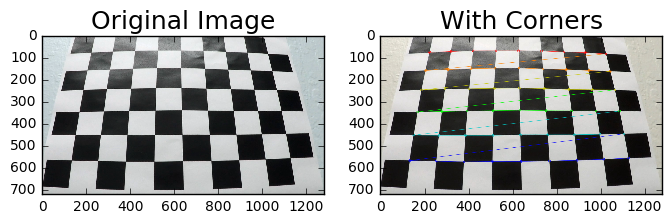

In [4]:
if calibration_parameters1('../camera_cal/calibration3.jpg'):
    mtx,dist=calibration_parameters1('../camera_cal/calibration3.jpg',show=False)
    print('OK')
else:
    print('NOK')

##  How to perspective transform image 
Firstly,I choose the dot and draw line for better perspective transform.
Then I define the src points and dst points, so can I get the transform matrix by function pespective_transform().
In that way, I can warp the image by function warp_image( ).

For convenience, I define a bird_eye() to summary these steps.
After that, I tried all the test image. It seems not bad.

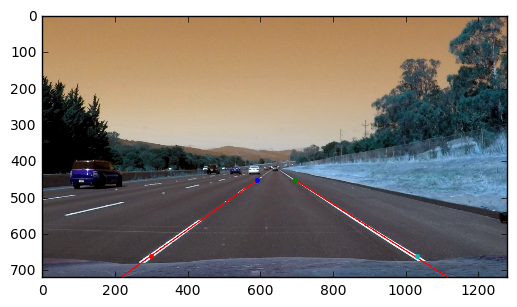

In [5]:
lena=cv2.imread('../test_images/straight_lines2.jpg')
plt.imshow(lena)
plt.plot(590,450,'.')
plt.plot(695,450,'.')
plt.plot(300,660,'.')
plt.plot(1030,660,'.')



cv2.line(lena, (595,450), (217,720), color=[255, 0, 0], thickness=2)
cv2.line(lena, (691,450), (1113,720), color=[255, 0, 0], thickness=2)
plt.imshow(lena,'gray')

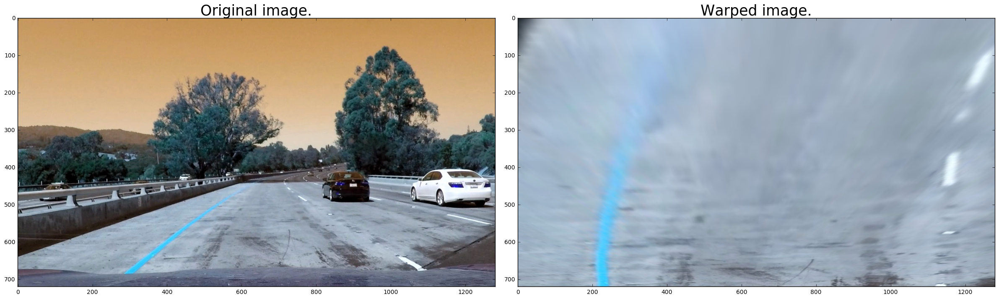

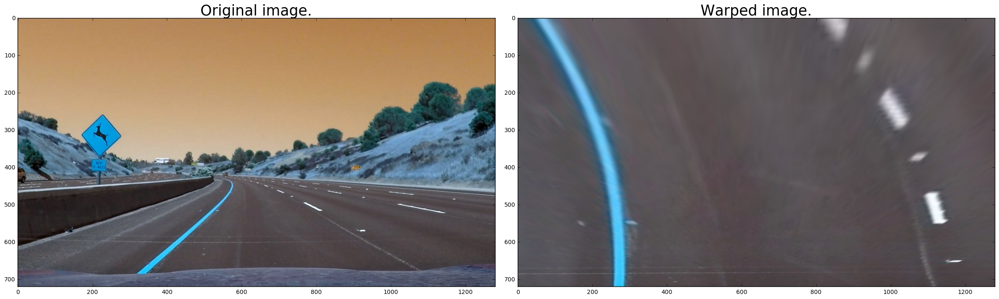

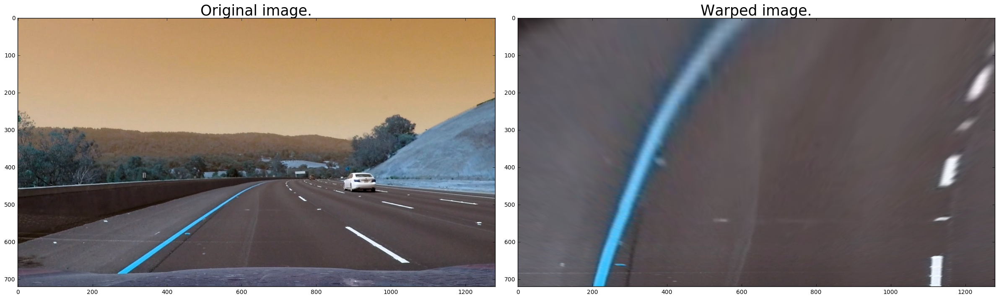

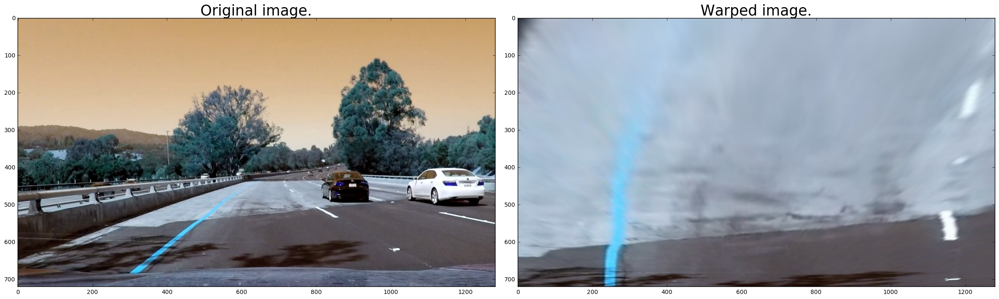

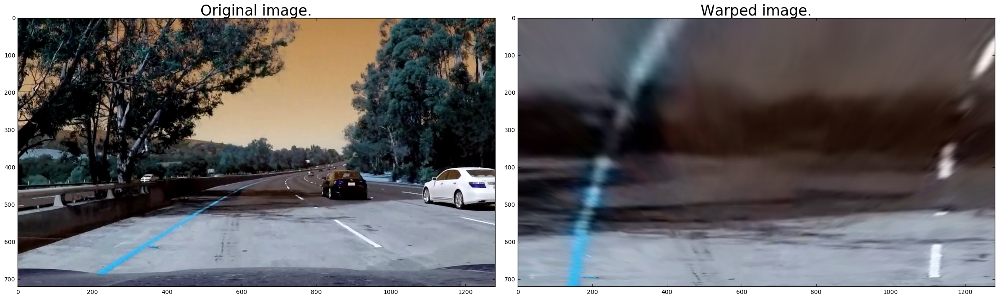

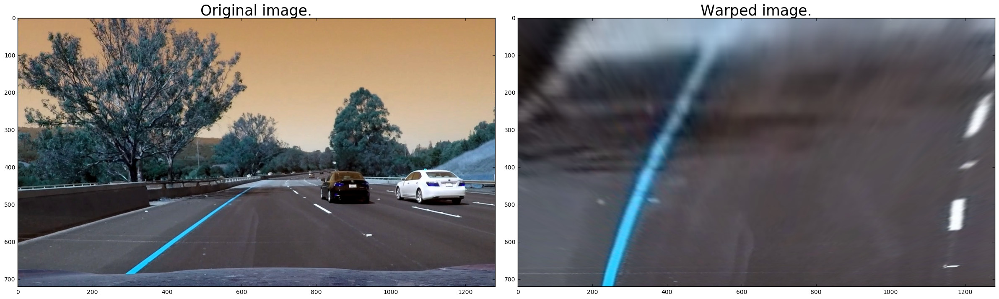

In [8]:
def perspective_transform(src_points, dst_points):
    """Compute perspective transform from source and destination points.
    """
    mtx_perp = cv2.getPerspectiveTransform(src_points, dst_points)
    mtx_perp_inv = cv2.getPerspectiveTransform(dst_points, src_points)
    return mtx_perp, mtx_perp_inv

def warp_image(img, mtx_perp, flags=cv2.INTER_LINEAR):
    """Warp an image using a transform matrix.
    """
    img_size = (img.shape[1], img.shape[0])
    #img_size=img.shape[::-1]
    warped_image=cv2.warpPerspective(img, mtx_perp,img_size)
    return warped_image



#lena=cv2.imread('../test_images/straight_lines2.jpg')
#img_size = (lena.shape[1], lena.shape[0])

        # For source points I'm grabbing the outer four detected corners
src1 = np.float32([[590,450],[695,450],[300,660],[1030,660]])
src2 = np.float32([[595,450], [691,450],[217,720],[1113,720]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
dst = np.float32([[200,0], [1100,0],[200,720],[1100,720]])
        # Given src and dst points, calculate the perspective transform matrix
#M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()

mtx_perp1,mtx_perp_inv1=perspective_transform(src1,dst)
mtx_perp2,mtx_perp_inv2=perspective_transform(src2,dst)
#for fname in glob.glob('../test_images/test*.jpg'):
#img=cv2.imread(fname)
#img_size = (img.shape[1], img.shape[0])

# Make a list of calibration images
#images = glob.glob('../test_images/test*.jpg')


def test_perspective(img, mtx_perp):
    """Test the perspective transform on a sample image.
    """
    
    # Ugly hack to print lines!
    #img=cv2.imread(image)

    # Apply transform.
    wimg = warp_image(img, mtx_perp)
    # Plot result.
    #plot_dual(img, wimg,title1='Original image.',title2='Warped image.', figsize=(24, 9))
    return wimg

# Make a list of calibration images
#images = glob.glob('../test_images/test*.jpg')

def bird_eye(img,mtx_perp,mtx,dist):
    undist=undistort_image(cv2.imread(img), mtx, dist)
    wimg=test_perspective(undist,mtx_perp)
    return wimg
    


images = glob.glob('../test_images/test*.jpg')
for fname in images:
    wimg=bird_eye(fname,mtx_perp1,mtx,dist)
    plot_double(cv2.imread(fname), wimg,title1='Original image.',title2='Warped image.', figsize=(24, 9))

## Apply threshold
I define function apply_thresholds() to apply threshold on the image. I use S channel in HLS format and L channel in LUV format an then B channel in Lab format.

Finally, I drop the S binary threshold because it added extra noise to the binary image and interfered with detecting lane lines accurately.

The result look good.

In [9]:
# Create binary thresholded images to isolate lane line pixels
def apply_thresholds(image, mtx_perp, mtx,dist,show=True):
        
    #####
    undist=undistort_image(cv2.imread(image), mtx, dist)
    image1=test_perspective(undist,mtx_perp)
    
    '''
    # Choose a Sobel kernel size
    ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image1, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(image1, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(image1, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(image1, sobel_kernel=ksize, thresh=(0.1, 1.1))
    s_threshed=s_threshold(image1,thresh=(100,100),s_thresh=(110,255))


    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1)))&(s_threshed==1)] = 1
    
    '''
    
    s_channel = cv2.cvtColor(image1, cv2.COLOR_BGR2HLS)[:,:,2]
    
    l_channel = cv2.cvtColor(image1, cv2.COLOR_BGR2LUV)[:,:,0]

    b_channel = cv2.cvtColor(image1, cv2.COLOR_BGR2Lab)[:,:,2]   

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    b_thresh_min = 155
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    l_thresh_min = 225
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    #color_binary = np.dstack((u_binary, s_binary, l_binary))
    
    combined_binary = np.zeros_like(s_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    if show == True:
        # Plotting thresholded images
        f, ((ax1, ax2, ax3), (ax4,ax5, ax6)) = plt.subplots(2, 3, sharey='col', sharex='row', figsize=(10,4))
        f.tight_layout()
        
        ax1.set_title('Original Image', fontsize=16)
        ax1.imshow(undist)
        
        ax2.set_title('Warped Image', fontsize=16)
        ax2.imshow(image1.astype('uint8'))
        
        ax3.set_title('s binary threshold', fontsize=16)
        ax3.imshow(s_binary, cmap='gray')
        
        ax4.set_title('b binary threshold', fontsize=16)
        ax4.imshow(b_binary, cmap='gray')
        
        ax5.set_title('l binary threshold', fontsize=16)
        ax5.imshow(l_binary, cmap='gray')

        ax6.set_title('Combined color thresholds', fontsize=16)
        ax6.imshow(combined_binary, cmap='gray')
        
        
    else: 
        return combined_binary

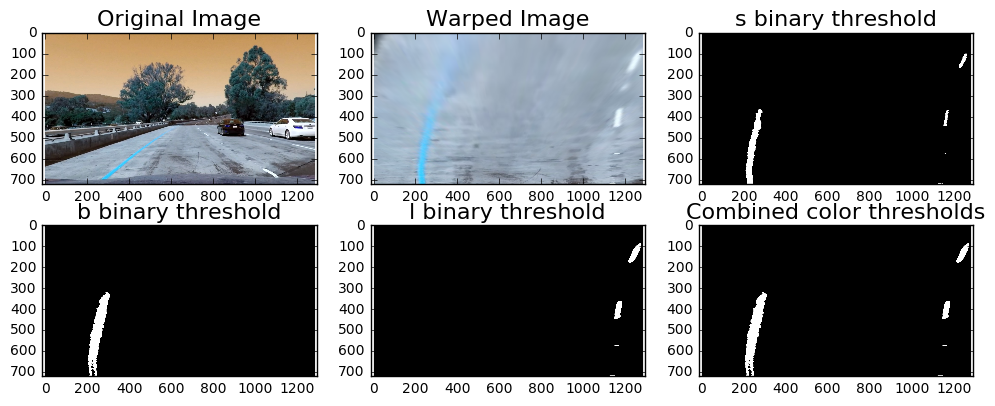

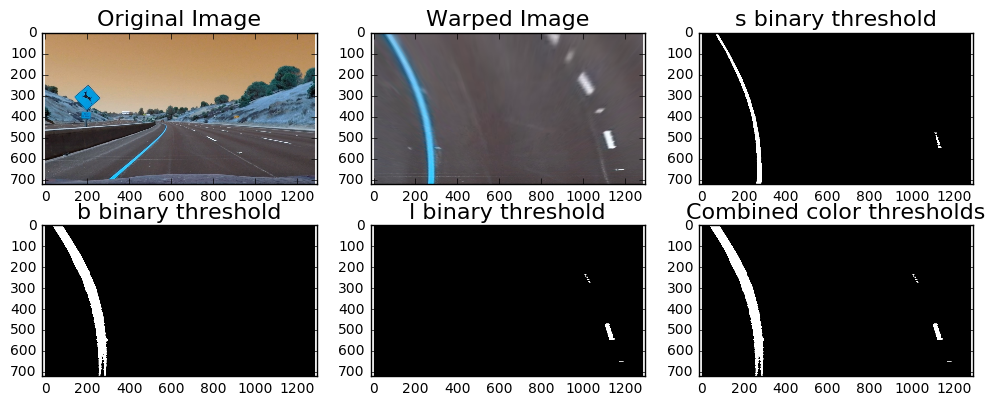

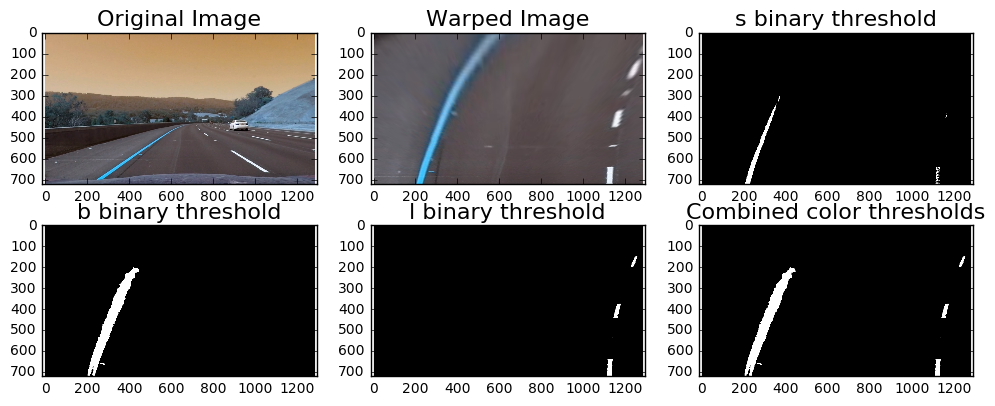

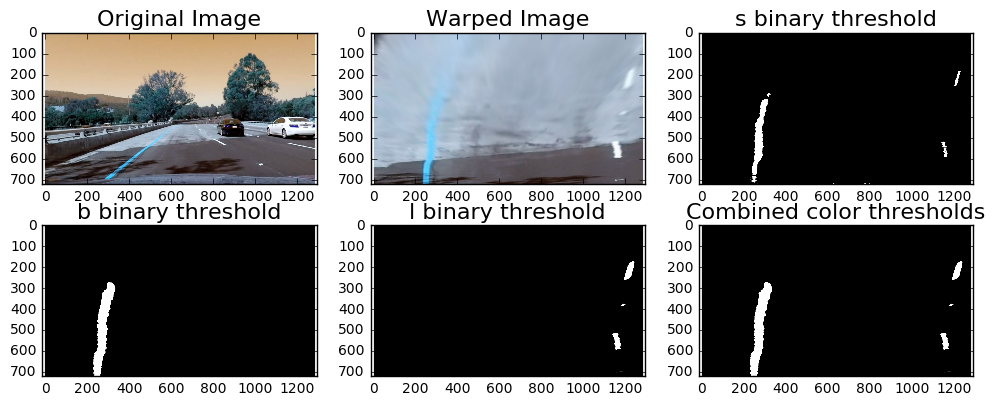

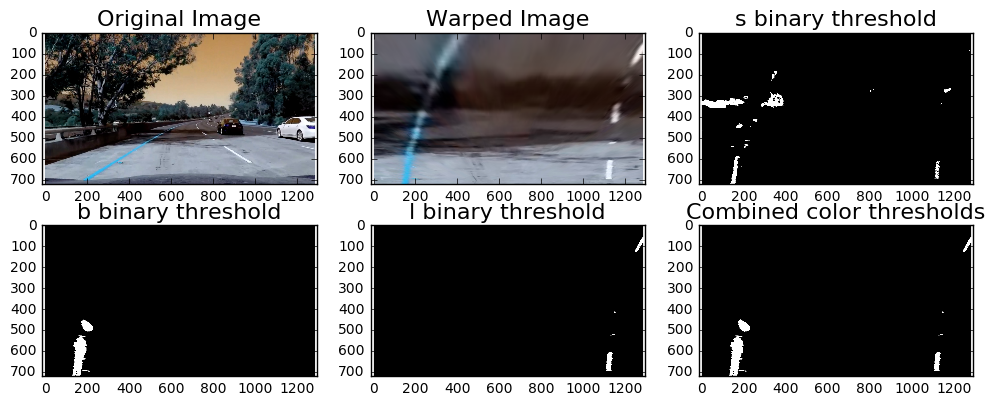

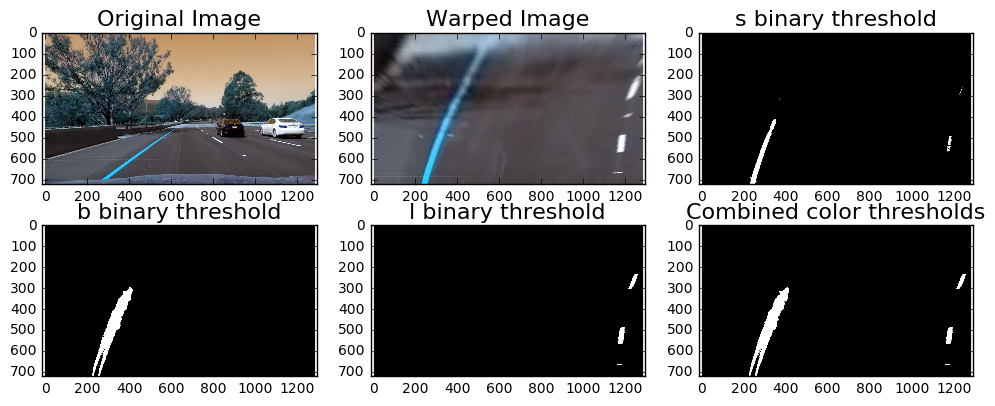

In [12]:
for image in glob.glob('../test_images/test*.jpg'):
    combined=apply_thresholds(image,mtx_perp1, mtx,dist,show=True)
    #plot_double(cv2.imread(image), combined, title1='Original Image', title2='Combined Gradient', figsize=(24, 9))

## Fitting a polynomial to the lane lines, calculating vehicle position and radius of curvature
I use the combined image function to get isolated lane line, then I fit a polynomial to both of the lane line.
Then I calculate the radius of curvature.
In the function fill_lane() below, lane lines are detected by identifying peaks in a histogram of the image and detecting nonzero pixels in close proximity to the peaks.
I summary a function by pipeline() for convenience. 

In [27]:
def fill_lane(image,mtx_perp,mtx_perp_inv,mtx,dist,show=True):
    
    combined_binary = apply_thresholds(image, mtx_perp,mtx,dist,show=False)
    
    rightx = []
    righty = []
    leftx = []
    lefty = []
    
    x, y = np.nonzero(np.transpose(combined_binary))
    i = 720
    j = 630
    while j >= 0:
        histogram = np.sum(combined_binary[j:i,:], axis=0)
        left_peak = np.argmax(histogram[:640])
        x_idx = np.where((((left_peak - 25) < x)&(x < (left_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            leftx.extend(x_window.tolist())
            lefty.extend(y_window.tolist())

        right_peak = np.argmax(histogram[640:]) + 640
        x_idx = np.where((((right_peak - 25) < x)&(x < (right_peak + 25))&((y > j) & (y < i))))
        x_window, y_window = x[x_idx], y[x_idx]
        if np.sum(x_window) != 0:
            rightx.extend(x_window.tolist())
            righty.extend(y_window.tolist())
        i -= 90
        j -= 90

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    rightx_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    rightx = np.append(rightx,rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx,right_fit[0]*0**2 + right_fit[1]*0 + right_fit[2])
    righty = np.append(righty, 0)
    leftx_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx,left_fit[0]*0**2 + left_fit[1]*0 + left_fit[2])
    lefty = np.append(lefty, 0)
    lsort = np.argsort(lefty)
    rsort = np.argsort(righty)
    lefty = lefty[lsort]
    leftx = leftx[lsort]
    righty = righty[rsort]
    rightx = rightx[rsort]
    left_fit = np.polyfit(lefty, leftx, 2)
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fit = np.polyfit(righty, rightx, 2)
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty) + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty) + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    
    # Calculate the position of the vehicle
    center = abs(640 - ((rightx_int+leftx_int)/2))
    
    offset = 0 
    img=cv2.imread(image)
    img_size = (img.shape[1], img.shape[0])
    
    
    
    src = np.float32([[590,450],[695,450],[300,660],[1030,660]])
    #src2 = np.float32([[595,450], [691,450],[217,720],[1113,720]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
    dst = np.float32([[200,0], [1100,0],[200,720],[1100,720]])
    
    
    
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp = cv2.warpPerspective(color_warp, mtx_perp_inv, (combined_binary.shape[1], combined_binary.shape[0]))
    result = cv2.addWeighted(mpimg.imread(image), 1, newwarp, 0.5, 0)
    
    
    ####### change current image to bird_eye by using function bird_eye()
    wimg=bird_eye(image,mtx_perp,mtx,dist)
    
    if show:
        f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(wimg, cv2.COLOR_BGR2RGB))
        ax1.set_xlim(0, 1280)
        ax1.set_ylim(0, 720)
        ax1.plot(left_fitx, lefty, color='green', linewidth=3)
        ax1.plot(right_fitx, righty, color='green', linewidth=3)
        ax1.set_title('Fit Polynomial to Lane Lines', fontsize=16)
        ax1.invert_yaxis() # to visualize as we do the images
        ax2.imshow(result)
        ax2.set_title('Fill Lane Between Polynomials', fontsize=16)
        if center < 640:
            ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*3.7/700),
                     style='italic', color='white', fontsize=10)
        else:
            ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*3.7/700),
                     style='italic', color='white', fontsize=10)
        ax2.text(200, 175, 'Radius of curvature is {}m'.format(int((left_curverad + right_curverad)/2)),
                 style='italic', color='white', fontsize=10)
    return result

In [28]:
def pipeline(img):
    

# Step through the list and search for chessboard corners
    #fname='../camera_cal/calibration4.jpg'
    mtx,dist=calibration_parameters1('../camera_cal/calibration3.jpg',show=False)
    #undist = cv2.undistort(cv2.imread(fname), mtx, dist, None, mtx) 
    #undist=undistort_image(cv2.imread(fname), mtx, dist)
            # For source points I'm grabbing the outer four detected corners
    src1 = np.float32([[590,450],[695,450],[300,660],[1030,660]])
    #src2 = np.float32([[595,450], [691,450],[217,720],[1113,720]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
    dst = np.float32([[200,0], [1100,0],[200,720],[1100,720]])
        # Given src and dst points, calculate the perspective transform matrix
    #M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()

    mtx_perp1,mtx_perp_inv1=perspective_transform(src1,dst)
    #mtx_perp2,mtx_perp_inv2=perspective_transform(src2,dst)
    final_image=fill_lane(img,mtx_perp1,mtx_perp_inv1,mtx,dist,show=True)
    return final_image  

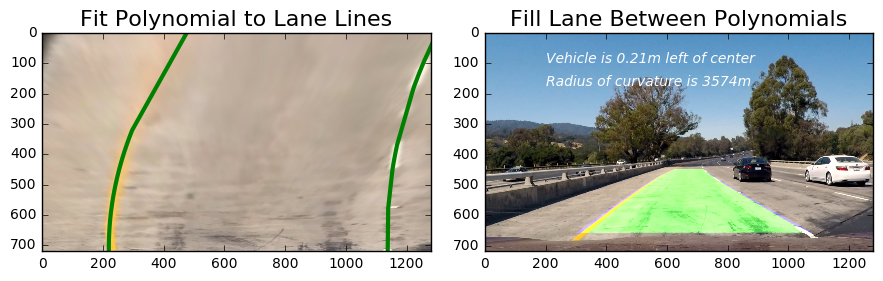

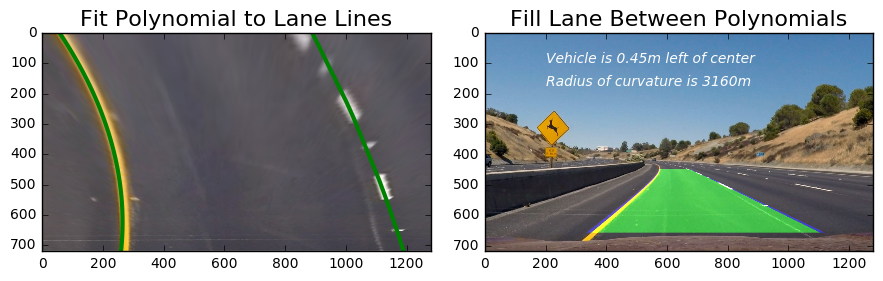

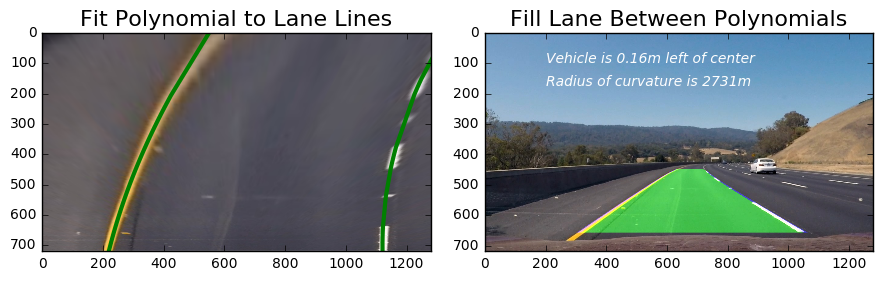

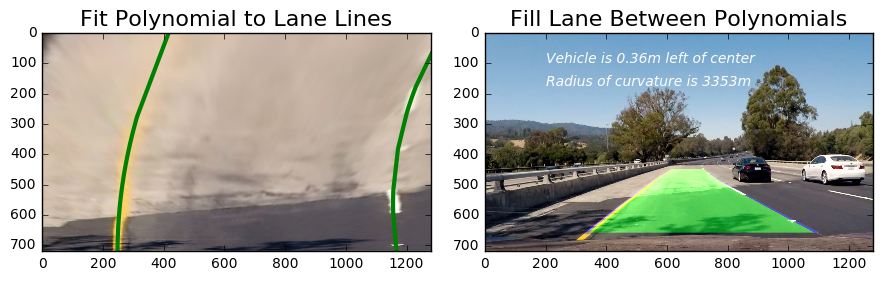

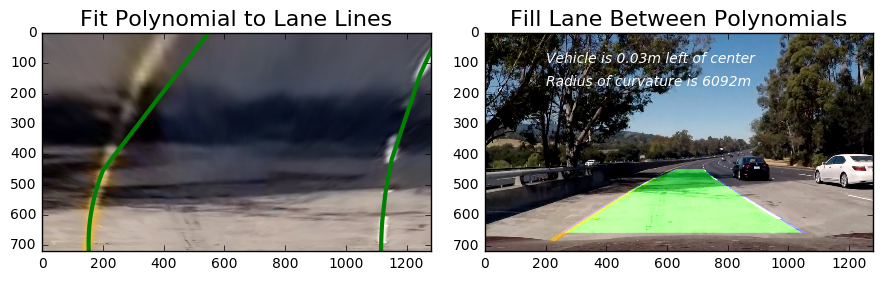

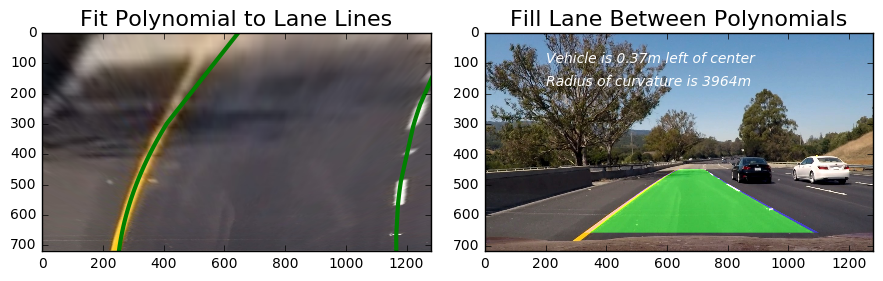

In [29]:
for fname in glob.glob('../test_images/test*.jpg'):
    #image_test='../test_images/test1.jpg'
    #fill_lane(fname,mtx_perp1,mtx_perp_inv1,mtx,dist,show=False)
    result=pipeline(fname)
    '''
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=18)
    ax2.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax2.set_title('With Corners', fontsize=18)
    '''

##  Video Processing Pipeline:

First build a class line() and a  function process_vid().
class line() contains some function for detect the lane line.
process_vid() process a video frame.

In [30]:

# Video Processing Pipeline
def process_vid(image):
    #img_size = (image.shape[1], image.shape[0])
    
    # Calibrate camera and undistort image
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    mtx,dist=calibration_parameters1('../camera_cal/calibration3.jpg',show=False)
    #undist = cv2.undistort(image, mtx, dist, None, mtx)
    undist=undistort_image(image, mtx, dist)
    
    # Perform perspective transform
    offset = 0
    
    
    '''
    src = np.float32([[490, 482],[810, 482],
                      [1250, 720],[0, 720]])
    dst = np.float32([[0, 0], [1280, 0], 
                     [1250, 720],[40, 720]])
    '''
    
    
    src1 = np.float32([[590,450],[695,450],[300,660],[1030,660]])
    #src2 = np.float32([[595,450], [691,450],[217,720],[1113,720]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
    dst = np.float32([[200,0], [1100,0],[200,720],[1100,720]])
        # Given src and dst points, calculate the perspective transform matrix
    #M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()

    mtx_perp1,mtx_perp_inv1=perspective_transform(src1,dst)
    warped=warp_image(undist, mtx_perp1, flags=cv2.INTER_LINEAR)
    
    '''
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    
    '''
    # Generate binary thresholded images
    b_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab)[:,:,2]
    l_channel = cv2.cvtColor(warped, cv2.COLOR_RGB2LUV)[:,:,0]  
    
    # Set the upper and lower thresholds for the b channel
    b_thresh_min = 145
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1
    
    # Set the upper and lower thresholds for the l channel
    l_thresh_min = 215
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1

    combined_binary = np.zeros_like(b_binary)
    combined_binary[(l_binary == 1) | (b_binary == 1)] = 1
    
    # Identify all non zero pixels in the image
    x, y = np.nonzero(np.transpose(combined_binary)) 

    if Left.found == True: # Search for left lane pixels around previous polynomial
        leftx, lefty, Left.found = Left.found_search(x, y)
        
    if Right.found == True: # Search for right lane pixels around previous polynomial
        rightx, righty, Right.found = Right.found_search(x, y)

            
    if Right.found == False: # Perform blind search for right lane lines
        rightx, righty, Right.found = Right.blind_search(x, y, combined_binary)
            
    if Left.found == False:# Perform blind search for left lane lines
        leftx, lefty, Left.found = Left.blind_search(x, y, combined_binary)

    lefty = np.array(lefty).astype(np.float32)
    leftx = np.array(leftx).astype(np.float32)
    righty = np.array(righty).astype(np.float32)
    rightx = np.array(rightx).astype(np.float32)
            
    # Calculate left polynomial fit based on detected pixels
    left_fit = np.polyfit(lefty, leftx, 2)
    
    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    leftx_int, left_top = Left.get_intercepts(left_fit)
    
    # Average intercepts across n frames
    Left.x_int.append(leftx_int)
    Left.top.append(left_top)
    leftx_int = np.mean(Left.x_int)
    left_top = np.mean(Left.top)
    Left.lastx_int = leftx_int
    Left.last_top = left_top
    
    # Add averaged intercepts to current x and y vals
    leftx = np.append(leftx, leftx_int)
    lefty = np.append(lefty, 720)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 0)
    
    # Sort detected pixels based on the yvals
    leftx, lefty = Left.sort_vals(leftx, lefty)
    
    Left.X = leftx
    Left.Y = lefty
    
    # Recalculate polynomial with intercepts and average across n frames
    left_fit = np.polyfit(lefty, leftx, 2)
    Left.fit0.append(left_fit[0])
    Left.fit1.append(left_fit[1])
    Left.fit2.append(left_fit[2])
    left_fit = [np.mean(Left.fit0), 
                np.mean(Left.fit1), 
                np.mean(Left.fit2)]
    
    # Fit polynomial to detected pixels
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    Left.fitx = left_fitx
    
    # Calculate right polynomial fit based on detected pixels
    right_fit = np.polyfit(righty, rightx, 2)

    # Calculate intercepts to extend the polynomial to the top and bottom of warped image
    rightx_int, right_top = Right.get_intercepts(right_fit)
    
    # Average intercepts across 5 frames
    Right.x_int.append(rightx_int)
    rightx_int = np.mean(Right.x_int)
    Right.top.append(right_top)
    right_top = np.mean(Right.top)
    Right.lastx_int = rightx_int
    Right.last_top = right_top
    rightx = np.append(rightx, rightx_int)
    righty = np.append(righty, 720)
    rightx = np.append(rightx, right_top)
    righty = np.append(righty, 0)
    
    # Sort right lane pixels
    rightx, righty = Right.sort_vals(rightx, righty)
    Right.X = rightx
    Right.Y = righty
    
    # Recalculate polynomial with intercepts and average across n frames
    right_fit = np.polyfit(righty, rightx, 2)
    Right.fit0.append(right_fit[0])
    Right.fit1.append(right_fit[1])
    Right.fit2.append(right_fit[2])
    right_fit = [np.mean(Right.fit0), np.mean(Right.fit1), np.mean(Right.fit2)]
    
    # Fit polynomial to detected pixels
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    Right.fitx = right_fitx
        
    # Compute radius of curvature for each lane in meters
    left_curverad = Left.radius_of_curvature(leftx, lefty)
    right_curverad = Right.radius_of_curvature(rightx, righty)
        
    # Only print the radius of curvature every 3 frames for improved readability
    if Left.count % 3 == 0:
        Left.radius = left_curverad
        Right.radius = right_curverad
        
    # Calculate the vehicle position relative to the center of the lane
    position = (rightx_int+leftx_int)/2
    distance_from_center = abs((640 - position)*3.7/700) 
                
    #Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.flipud(np.transpose(np.vstack([Left.fitx, Left.Y])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, Right.Y]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_(pts), (34,255,34))
    newwarp = cv2.warpPerspective(color_warp, mtx_perp_inv1, (image.shape[1], image.shape[0]))
    result = cv2.addWeighted(undist, 1, newwarp, 0.5, 0)
        
    # Print distance from center on video
    if position > 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right of center'.format(distance_from_center), (100,80),
                 fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    # Print radius of curvature on video
    cv2.putText(result, 'Radius of Curvature {}(m)'.format(int((Left.radius+Right.radius)/2)), (120,140),
             fontFace = 16, fontScale = 2, color=(255,255,255), thickness = 2)
    Left.count += 1
    return result

In [31]:
class Line:
    def __init__(self):
        # Was the line found in the previous frame?
        self.found = False
        
        # Remember x and y values of lanes in previous frame
        self.X = None
        self.Y = None
        
        # Store recent x intercepts for averaging across frames
        self.x_int = deque(maxlen=10)
        self.top = deque(maxlen=10)
        
        # Remember previous x intercept to compare against current one
        self.lastx_int = None
        self.last_top = None
        
        # Remember radius of curvature
        self.radius = None
        
        # Store recent polynomial coefficients for averaging across frames
        self.fit0 = deque(maxlen=10)
        self.fit1 = deque(maxlen=10)
        self.fit2 = deque(maxlen=10)
        self.fitx = None
        self.pts = []
        
        # Count the number of frames
        self.count = 0
    def blind_search(self, x, y, image):
        '''
        This function is applied in the first few frames and/or if the lane was not successfully detected
        in the previous frame. It uses a slinding window approach to detect peaks in a histogram of the
        binary thresholded image. Pixels in close proimity to the detected peaks are considered to belong
        to the lane lines.
        '''
        xvals = []
        yvals = []
        if self.found == False: 
            i = 720
            j = 630
            while j >= 0:
                histogram = np.sum(image[j:i,:], axis=0)
                if self == Right:
                    peak = np.argmax(histogram[640:]) + 640
                else:
                    peak = np.argmax(histogram[:640])
                x_idx = np.where((((peak - 25) < x)&(x < (peak + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    xvals.extend(x_window)
                    yvals.extend(y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) > 0:
            self.found = True
        else:
            yvals = self.Y
            xvals = self.X
        return xvals, yvals, self.found
    def get_intercepts(self, polynomial):
        bottom = polynomial[0]*720**2 + polynomial[1]*720 + polynomial[2]
        top = polynomial[0]*0**2 + polynomial[1]*0 + polynomial[2]
        return bottom, top
    def sort_vals(self, xvals, yvals):
        sorted_index = np.argsort(yvals)
        sorted_yvals = yvals[sorted_index]
        sorted_xvals = xvals[sorted_index]
        return sorted_xvals, sorted_yvals
    def radius_of_curvature(self, xvals, yvals):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(yvals) + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
    def found_search(self, x, y):
        '''
        This function is applied when the lane lines have been detected in the previous frame.
        It uses a sliding window to search for lane pixels in close proximity (+/- 25 pixels in the x direction)
        around the previous detected polynomial. 
        '''
        xvals = []
        yvals = []
        if self.found == True: 
            i = 720
            j = 630
            while j >= 0:
                yval = np.mean([i,j])
                xval = (np.mean(self.fit0))*yval**2 + (np.mean(self.fit1))*yval + (np.mean(self.fit2))
                x_idx = np.where((((xval - 25) < x)&(x < (xval + 25))&((y > j) & (y < i))))
                x_window, y_window = x[x_idx], y[x_idx]
                if np.sum(x_window) != 0:
                    np.append(xvals, x_window)
                    np.append(yvals, y_window)
                i -= 90
                j -= 90
        if np.sum(xvals) == 0: 
            self.found = False # If no lane pixels were detected then perform blind search
        return xvals, yvals, self.found

## Processing Video
Now we process the video.

In [32]:
Left = Line()
Right = Line()
video_output = 'result.mp4'
clip1 = VideoFileClip("../project_video.mp4") #.subclip(0,2)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [05:54<00:00,  3.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [33]:
Left = Line()
Right = Line()
video_output = 'result_challenge.mp4'
clip1 = VideoFileClip("../challenge_video.mp4") #.subclip(0,2)
white_clip = clip1.fl_image(process_vid) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result_challenge.mp4
[MoviePy] Writing video result_challenge.mp4


100%|██████████| 485/485 [01:33<00:00,  5.61it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result_challenge.mp4 

